# Priprema i vizualizacija podataka — Ivan Klabucar 0036513702

### Imports

In [153]:
import seaborn as sns
import matplotlib.pyplot as plt
from ucimlrepo import fetch_ucirepo 
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Omogucujemo prikaz vise podataka
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

## EDA — Wisconsin Breast Cancer Dataset

In [40]:
# Code from https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 
# data (as pandas dataframes) 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 
# metadata 
print(breast_cancer_wisconsin_diagnostic.metadata) 
# variable information 
print(breast_cancer_wisconsin_diagnostic.variables) 


{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Life Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Mon Jul 17 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53f0fbb42

Iz gornjeg ispisa saznajemo da nas kao zavisnu varijablu zanima najviše jedina kategorička varijabla Diagnosis (M = malignant, B = benign). Ostale varijable su numeričke kontinuirane, te čini se da nema nedostajućih vrijednosti.

In [41]:
X.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3'], dtype='object')

Preuzeto sa stranice dataset-a:

<pre>
The mean, standard error, and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features.  For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.</pre>

Dakle, "1", "2", i "3" u nazivu kolona označavaju odnosi li se kolona na:
- 1: srednja vrijednost atributa (texture1 = srednja vrijednost teksture)
- 2: standardna devijacija (texture2 = stddev od texture)
- 3: "Worst" (mean of the three largest values) (texture3 = najveća vrijednost teksture)

In [42]:
vars = breast_cancer_wisconsin_diagnostic.variables
feature_cols = list(vars[vars.role == "Feature"].name)
target_cols = list(vars[vars.role == "Target"].name)
print(f"Nezavisne varijable: {feature_cols}\n Zavisne varijable: {target_cols}")

Nezavisne varijable: ['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2', 'smoothness2', 'compactness2', 'concavity2', 'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3', 'symmetry3', 'fractal_dimension3']
 Zavisne varijable: ['Diagnosis']


In [43]:
breast_cancer_wisconsin_diagnostic.data.original.head()

,ID,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,radius2,texture2,perimeter2,area2,smoothness2,compactness2,concavity2,concave_points2,symmetry2,fractal_dimension2,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
0,842302,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,M
1,842517,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,84300903,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,84348301,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,84358402,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


Prvi pregled tablice ne otkriva ništa neobično.

Čitav dataset u istom dataframe-u dobijemo preko .data.original

In [44]:
df = breast_cancer_wisconsin_diagnostic.data.original
df.drop("ID", axis=1, inplace=True) # Ne treba nam ID kolona u eksploratornoj analizi, očito monotoni atribut
print(f"Oblik tablice: {df.shape}")

Oblik tablice: (569, 31)


Dataset sadrži 569 primjera.

## Nedostajuće vrijednosti

In [45]:
df.isna().sum()

radius1               0
texture1              0
perimeter1            0
area1                 0
smoothness1           0
compactness1          0
concavity1            0
concave_points1       0
symmetry1             0
fractal_dimension1    0
radius2               0
texture2              0
perimeter2            0
area2                 0
smoothness2           0
compactness2          0
concavity2            0
concave_points2       0
symmetry2             0
fractal_dimension2    0
radius3               0
texture3              0
perimeter3            0
area3                 0
smoothness3           0
compactness3          0
concavity3            0
concave_points3       0
symmetry3             0
fractal_dimension3    0
Diagnosis             0
dtype: int64

In [114]:
df.nunique()

radius1               456
texture1              479
perimeter1            522
area1                 539
smoothness1           474
compactness1          537
concavity1            537
concave_points1       542
symmetry1             432
fractal_dimension1    499
radius2               540
texture2              519
perimeter2            533
area2                 528
smoothness2           547
compactness2          541
concavity2            533
concave_points2       507
symmetry2             498
fractal_dimension2    545
radius3               457
texture3              511
perimeter3            514
area3                 544
smoothness3           411
compactness3          529
concavity3            539
concave_points3       492
symmetry3             500
fractal_dimension3    535
Diagnosis               2
Diagnosis_num           2
dtype: int64

Stvarno nema nedostajućih vrijednosti.

## Distribucija varijabli

In [46]:
df.Diagnosis.value_counts()

Diagnosis
B    357
M    212
Name: count, dtype: int64

Postoji 357 primjera benignih, te 212 primjera malignih tumora. Skup podataka ne pati od premale zastupljenosti jedne od klasa.

In [47]:
# Distribucije numeričkih varijabli
df.describe()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,radius2,texture2,perimeter2,area2,smoothness2,compactness2,concavity2,concave_points2,symmetry2,fractal_dimension2,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


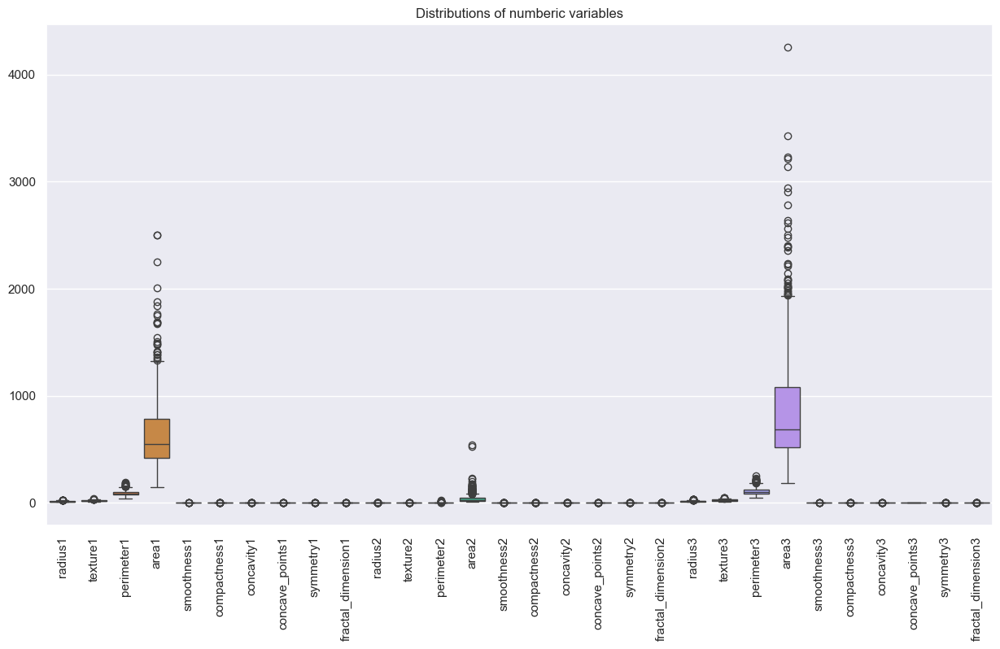

In [54]:
sns.set(rc={'figure.figsize':(15,8)})
ax=sns.boxplot(data=df).set(title='Distributions of numberic variables')
plt.xticks(rotation=90)
plt.show()

Vidimo da različite varijable poprimaju drastično različite raspone, prema tome za određene algoritme će se varijable morati normalizirati.

Za dobiti osjećaj oblika pojedinh distribucija, možemo ih min-max skalirati prije crtanja boxplotova. (Očuva oblik boxplota, odnosno kao da je svaki box plot nacrtan na skali min-max raspona svoje varijable) 

In [49]:
df_min_max_scaled = (X[feature_cols] - X[feature_cols].min()) / (X[feature_cols].max() - X[feature_cols].min())

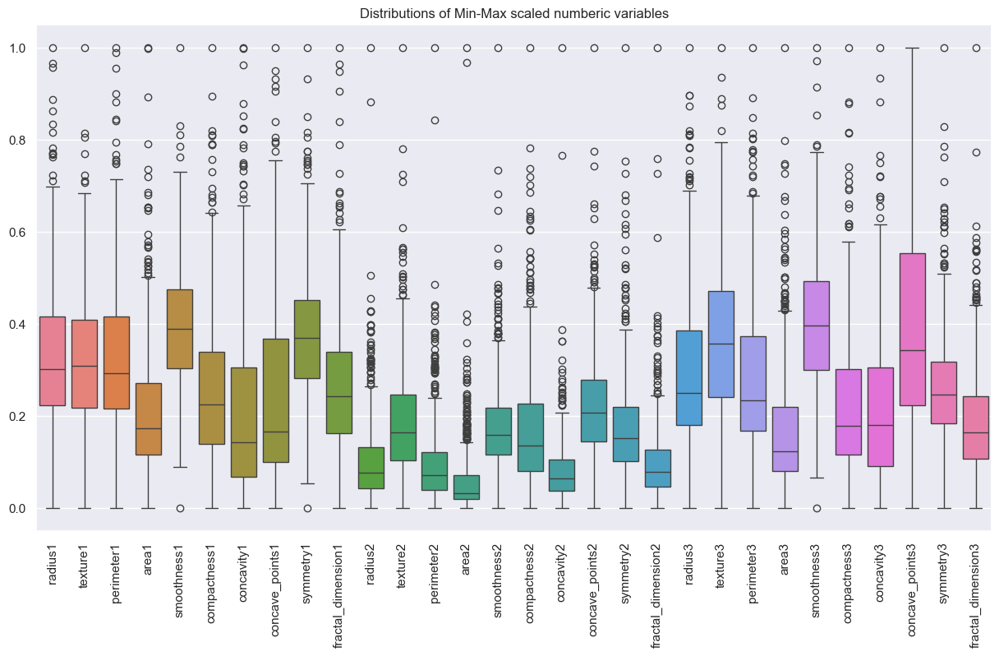

In [51]:
ax=sns.boxplot(data=df_min_max_scaled).set(title='Distributions of Min-Max scaled numberic variables')
plt.xticks(rotation=90)
plt.show()

Iz grafa se da zaključiti da su distribucije svih varijabli poprilično desno zakrivljene jer puno podataka pada iznad gornjeg "whisker"-a boxplota, a jako malo ispod doljnjeg. Ističe se varijabla area2 koja ima najekstremnije outliere, no kako je ovaj dataset pripremljen od strane stručnjaka, mala je vjerojatnost da su te vrijednosti netočne i da bi trebale biti zanemarene.

## Distribucije u odnosu na zavisnu varijablu

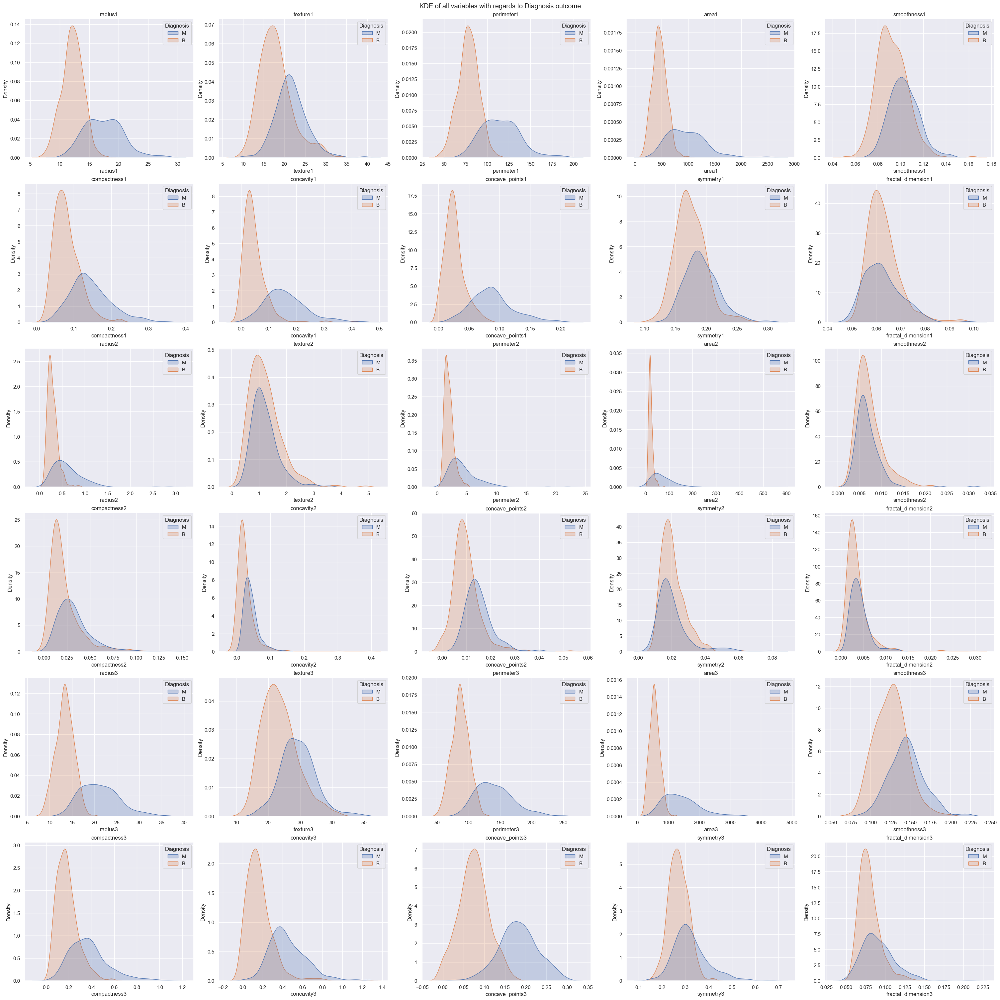

In [81]:
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(30, 30), constrained_layout=True)
 # Or equivalently,  "plt.tight_layout()"

for i, column in enumerate(feature_cols, 1):
    plt.subplot(6,5,i)
    sns.kdeplot(data=df, x=column, hue="Diagnosis", fill=True).set(title=column)
fig.suptitle('KDE of all variables with regards to Diagnosis outcome')
#fig.tight_layout()
plt.show()

Uočavamo da su distribucije mnogih nezavisnih varijabli zapravo bimodalne, sa različitim centrima ovisno o dijagnozi. Npr. concave_points3

## Korelacije varijabli

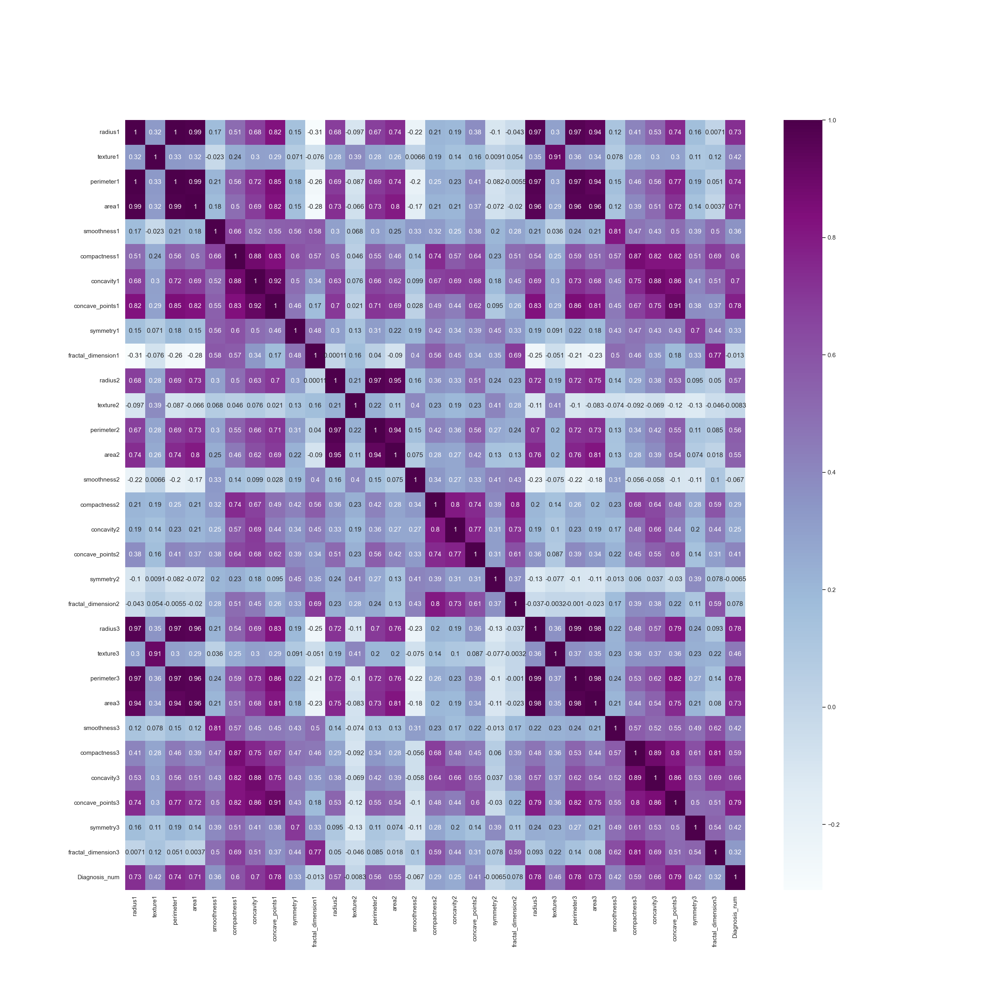

In [105]:
plt.close()
plt.cla()
plt.clf()
df['Diagnosis_num'] = df.Diagnosis.map({'B': 0, 'M': 1})
sns.heatmap(df.drop('Diagnosis', axis=1).corr(), annot=True, cmap="BuPu")
plt.show()

Uočavamo grozdove visoko koreliranih varijabi:
- radius, perimeter, area
- compactness, concavity, concave_point

Općenito postoji jako puno korelacije među zavisnim varijablama, redukcija dimenzionalnosti bi vjerojatno bila poželjna, ili korištenje modela koji dobro podnose jako korelirane feature-e poput Random Forest algoritma.

/Users/klabs/miniconda3/envs/py39/lib/python3.9/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


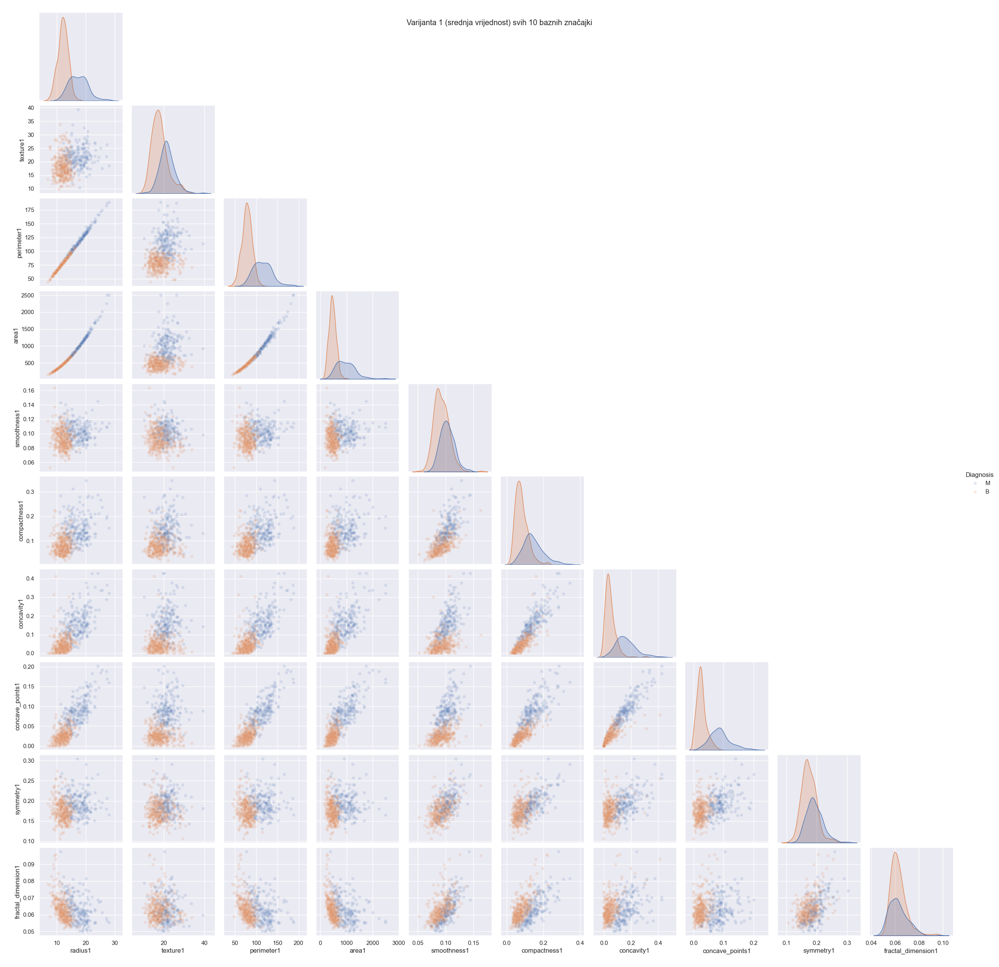

In [108]:
g=sns.pairplot(df[['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1', 'compactness1', 'concavity1', 'concave_points1', 'symmetry1', 'fractal_dimension1', 'Diagnosis']], 
             hue = "Diagnosis",
             corner = True, diag_kind='kde', plot_kws={'alpha': 0.15})
g.fig.suptitle('Varijanta 1 (srednja vrijednost) svih 10 baznih značajki')
plt.show()

/Users/klabs/miniconda3/envs/py39/lib/python3.9/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


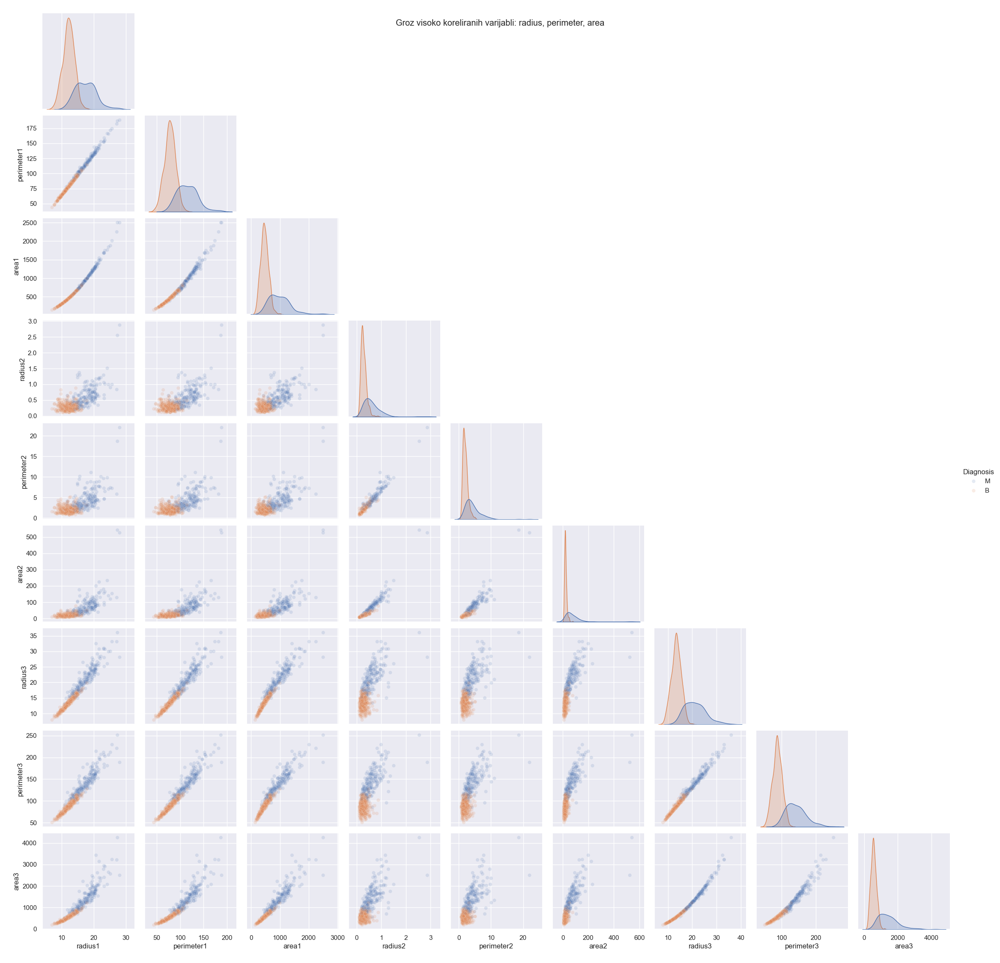

In [109]:
g=sns.pairplot(df[['radius1', 'perimeter1', 'area1', 'radius2', 'perimeter2', 'area2', 'radius3', 'perimeter3', 'area3', 'Diagnosis']], 
             hue = "Diagnosis",
             corner = True, diag_kind='kde', plot_kws={'alpha': 0.15})
g.fig.suptitle('Groz visoko koreliranih varijabli: radius, perimeter, area')
plt.show()

/Users/klabs/miniconda3/envs/py39/lib/python3.9/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


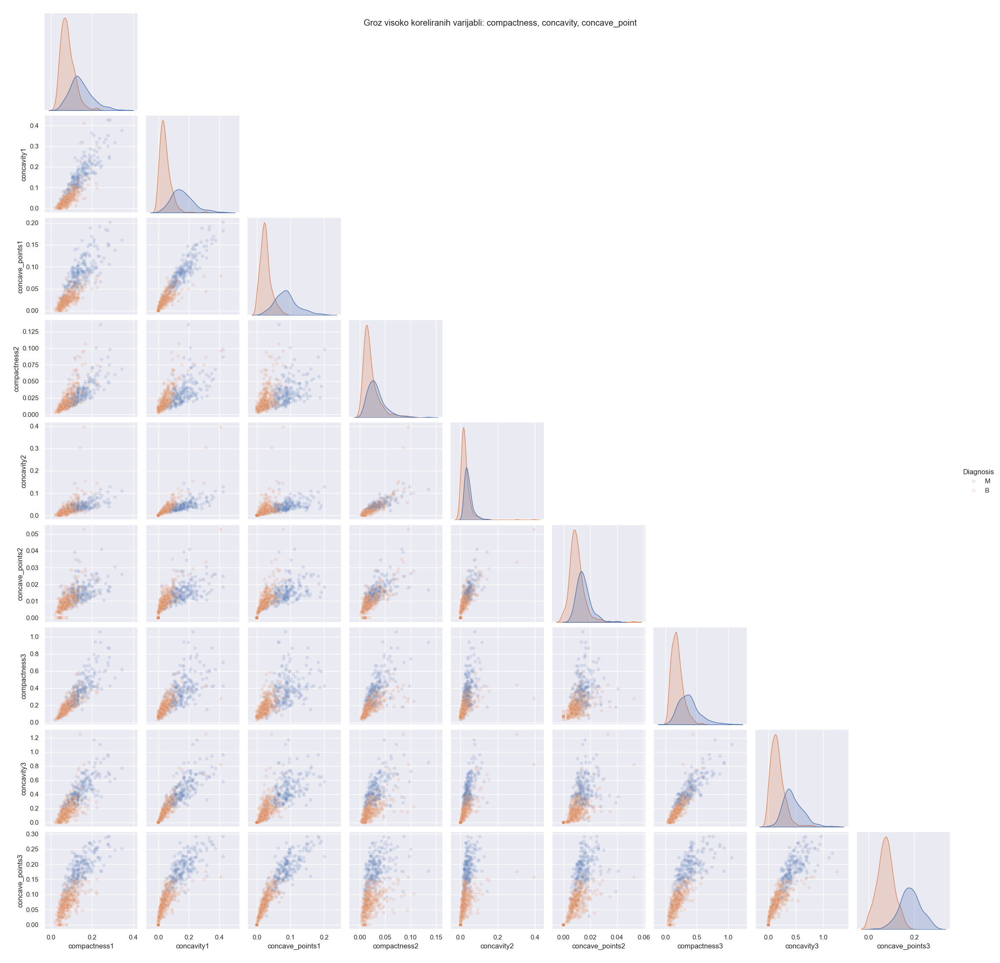

In [111]:
g=sns.pairplot(df[['compactness1', 'concavity1', 'concave_points1', 'compactness2', 'concavity2', 'concave_points2', 'compactness3', 'concavity3', 'concave_points3', 'Diagnosis']], 
             hue = "Diagnosis",
             corner = True, diag_kind='kde', plot_kws={'alpha': 0.15})
g.fig.suptitle('Groz visoko koreliranih varijabli: compactness, concavity, concave_point')
plt.show()

In [133]:
corrs = df.drop('Diagnosis', axis=1).corr()[['Diagnosis_num']].rename(columns={'Diagnosis_num': 'corr_with_target'})


In [135]:
corrs.loc[['radius1', 'perimeter1', 'area1', 'radius3', 'perimeter3', 'area3']]

,corr_with_target
radius1,0.730029
perimeter1,0.742636
area1,0.708984
radius3,0.776454
perimeter3,0.782914
area3,0.733825


In [141]:
least_corr_features = list(corrs[corrs.corr_with_target.abs() < 0.45].index)

In [144]:
corrs[corrs.corr_with_target.abs() < 0.45]

,corr_with_target
texture1,0.415185
smoothness1,0.358560
symmetry1,0.330499
fractal_dimension1,-0.012838
texture2,-0.008303
smoothness2,-0.067016
compactness2,0.292999
concavity2,0.253730
concave_points2,0.408042
symmetry2,-0.006522


/Users/klabs/miniconda3/envs/py39/lib/python3.9/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


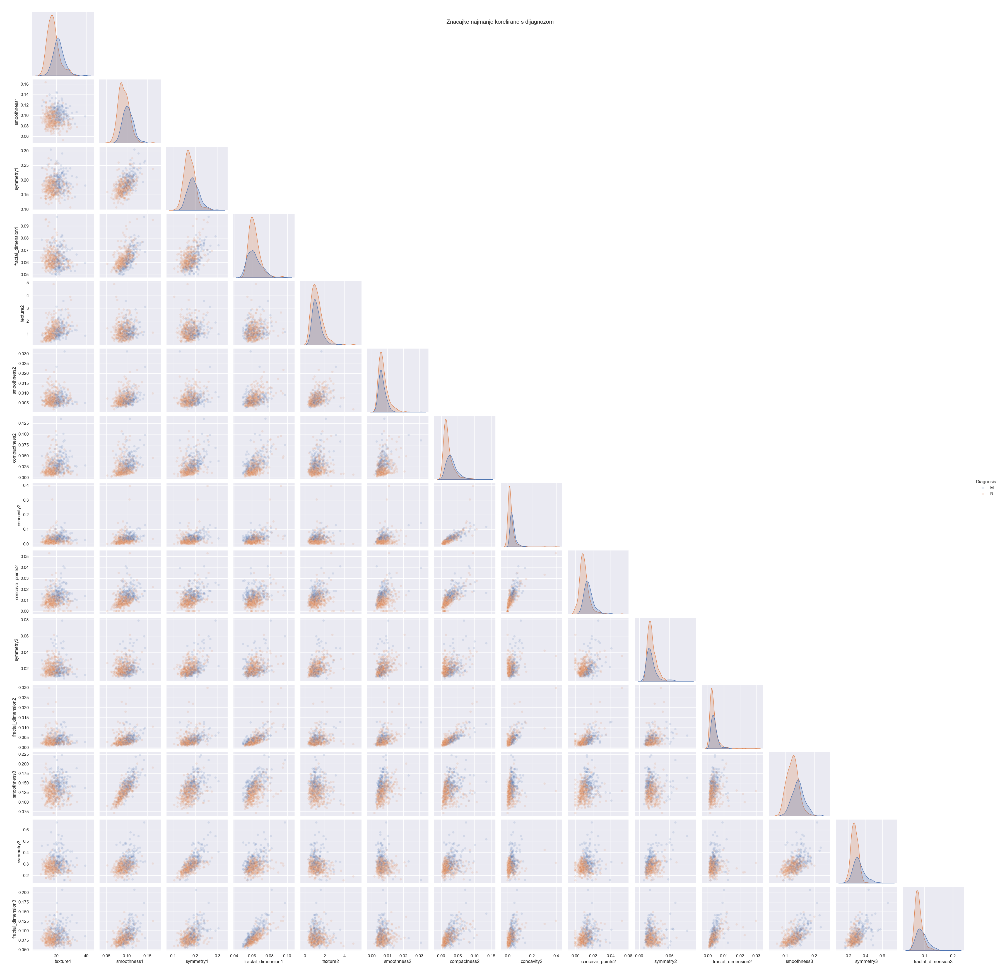

In [142]:
g=sns.pairplot(df[least_corr_features+['Diagnosis']], 
             hue = "Diagnosis",
             corner = True, diag_kind='kde', plot_kws={'alpha': 0.15})
g.fig.suptitle('Znacajke najmanje korelirane s dijagnozom')
plt.show()

Značajke slabo korelirane sa dijagnozom se ne mogu u potpunosti otpisati. Varijabla fractal_dimension1 sama po sebi ne donosi veliku prediktivnu moć, no u kombinaciji sa fractal_dimension3 ili smoothness1 jasnije dijeli skup podatka na B/M. To jest na tim scatter-plotovima postoji linija koja dosta dobro može odijeliti narančaste i plave točkice a da nije oblika x=const ili y=const.

In [148]:

kbest = SelectKBest(mutual_info_classif, k=10)



kbest.fit(df[feature_cols], df.Diagnosis_num)


SelectKBest(score_func=<function mutual_info_classif at 0x7f9d809bf280>)

In [149]:
kbest.get_support()

array([ True, False,  True,  True, False, False,  True,  True, False,
       False, False, False, False,  True, False, False, False, False,
       False, False,  True, False,  True,  True, False, False, False,
        True, False, False])

In [150]:

np.array(feature_cols)[kbest.get_support()]

array(['radius1', 'perimeter1', 'area1', 'concavity1', 'concave_points1',
       'area2', 'radius3', 'perimeter3', 'area3', 'concave_points3'],
      dtype='<U18')

/var/folders/2l/w_s2f2_j0y58gm69gshp8p140000gq/T/ipykernel_16068/2990227372.py:31: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


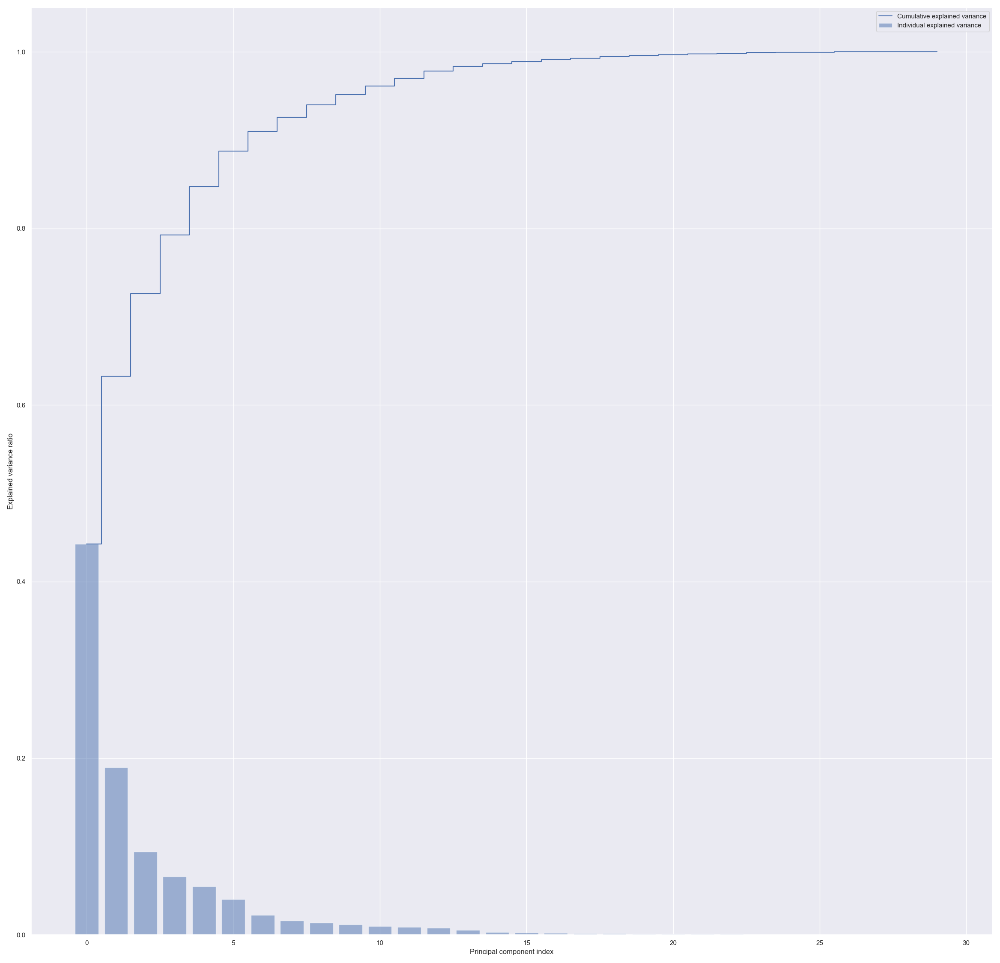

In [155]:
X = df[feature_cols].values
sc = StandardScaler()
sc.fit(X)
X_std = sc.transform(X)

pca = PCA()
#
# Determine transformed features
#
X_pca = pca.fit_transform(X_std)
#
# Determine explained variance using explained_variance_ration_ attribute
#
exp_var_pca = pca.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.close()
plt.cla()
plt.clf()
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [158]:
cum_sum_eigenvalues[14]

0.9864881227145469

Možemo smanjiti dimenzionalnost na 15 i sačuvati 98% varijance.

In [166]:
df_pca = pd.DataFrame(X_pca[:, :10])
df_pca['Diagnosis'] = df.Diagnosis

/Users/klabs/miniconda3/envs/py39/lib/python3.9/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


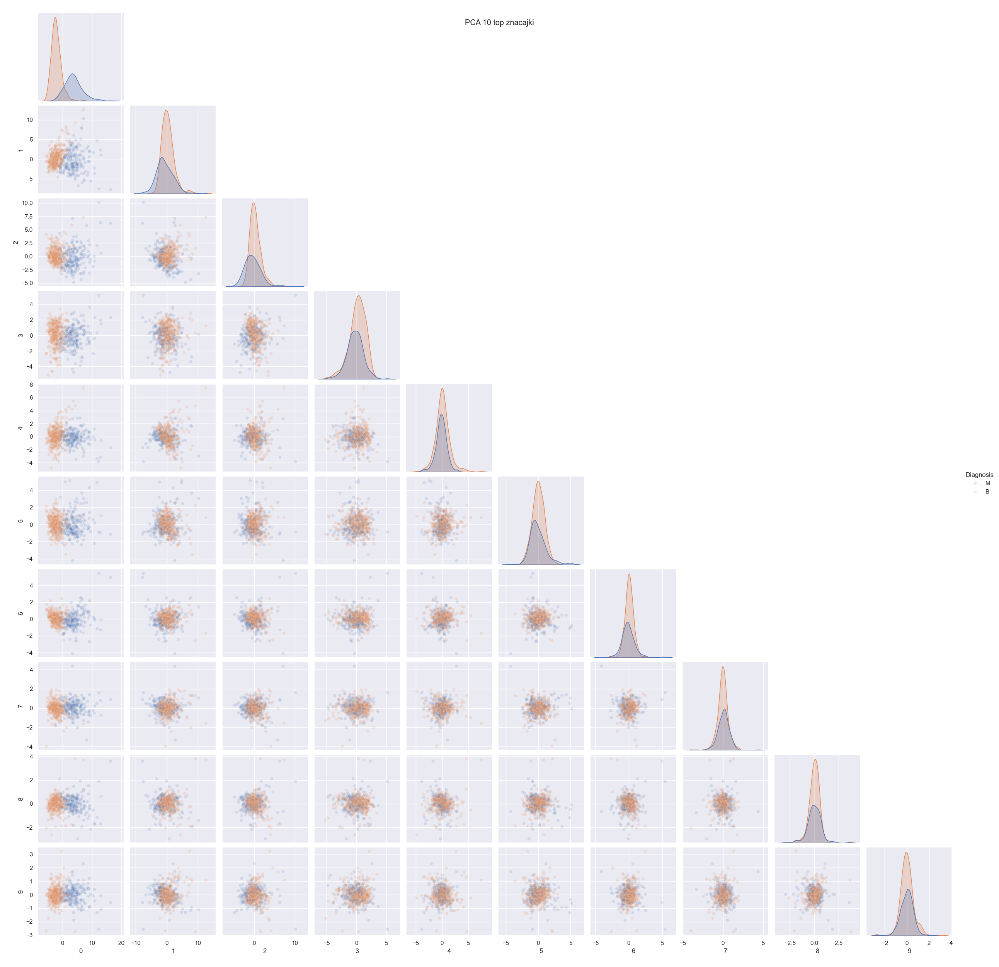

In [168]:
g=sns.pairplot(df_pca, 
             hue = "Diagnosis",
             corner = True, diag_kind='kde', plot_kws={'alpha': 0.15})
g.fig.suptitle('PCA 10 top znacajki')
plt.show()